In [48]:
import boto3
import json
import boto3
import pandas as pd 
from PIL import Image, ImageDraw, ImageFont
from io import BytesIO
from IPython.display import display

In [49]:
# import libraries
import requests
import zipfile
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# image stuff
# import face_recognition
from PIL import Image, ImageDraw, ImageFont, ImageFilter, ImageOps, ImageEnhance
# from google.colab.patches import cv2_imshow

## Example Detect Faces

In [3]:

def detect_faces(photo, bucket, region):
    
    session = boto3.Session()
    
    client = session.client('rekognition', region_name=region)

    response = client.detect_faces(Image={'S3Object':{'Bucket':bucket,'Name':photo}},
                                   Attributes=['ALL'])

    print('Detected faces for ' + photo)
    for faceDetail in response['FaceDetails']:
        print(f"The detected face is between {faceDetail['AgeRange']['Low']} and {faceDetail['AgeRange']['High']}  years old")

        print('Here are the other attributes:')
        print(json.dumps(faceDetail, indent=4, sort_keys=True))

        # Access predictions for individual face details and print them
        print(f"Gender    : {faceDetail['Gender']}" )
        print(f"Smile     : {faceDetail['Smile']}" )
        print(f"Eyeglasses: {faceDetail['Eyeglasses']}" )
        print(f"Emotions  : {faceDetail['Emotions'][0]}" )

    return len(response['FaceDetails'])
    

photo='Hewei_Shen.jpg'
bucket='shenh-faces-2024'
region='us-east-1'
face_count=detect_faces(photo, bucket, region)
print("Faces detected: " + str(face_count))


Detected faces for Hewei_Shen.jpg
The detected face is between 13 and 21  years old
Here are the other attributes:
{
    "AgeRange": {
        "High": 21,
        "Low": 13
    },
    "Beard": {
        "Confidence": 99.99385833740234,
        "Value": false
    },
    "BoundingBox": {
        "Height": 0.26641660928726196,
        "Left": 0.4514089822769165,
        "Top": 0.26114755868911743,
        "Width": 0.14329016208648682
    },
    "Confidence": 99.99989318847656,
    "Emotions": [
        {
            "Confidence": 97.65625,
            "Type": "CALM"
        },
        {
            "Confidence": 0.2741495966911316,
            "Type": "HAPPY"
        },
        {
            "Confidence": 0.2079010009765625,
            "Type": "CONFUSED"
        },
        {
            "Confidence": 0.09860992431640625,
            "Type": "SAD"
        },
        {
            "Confidence": 0.0017046928405761719,
            "Type": "ANGRY"
        },
        {
            "Confidence"

## Make a Collection

Once you've created a collection you can use an input face to search for matching user vectors or face vectors in a collection. Searching against user vectors can significantly improve accuracy compared to searching against individual face vectors. You can use faces detected in images, stored videos, and streaming videos to search against stored face vectors. You can use faces detected in images to search against stored user vectors.

To store face information, you’ll need to do the following:

- Create a Collection - To store facial information, you must first create (CreateCollection) a face collection in one of the AWS Regions in your account. You specify this face collection when you call the IndexFaces operation.

- Index Faces - The IndexFaces operation detects face(s) in an image, extracts, and stores the face vector(s) in the collection. You can use this operation to detect faces in an image and persist information about facial features that are detected into a collection. This is an example of a storage-based API operation because the service stores the face vector information on the server.

In [5]:
# Add faces to a collection
import boto3

def create_rekognition_collection(collection_id):
    client = boto3.client('rekognition')
    
    # Check if the collection already exists
    existing_collections = client.list_collections()
    if collection_id in existing_collections['CollectionIds']:
        print(f"Collection {collection_id} already exists.")
        return

    # Create the collection if it doesn't exist
    try:
        client.create_collection(CollectionId=collection_id)
        print(f"Collection {collection_id} created.")
    except client.exceptions.ResourceAlreadyExistsException:
        print(f"Collection {collection_id} already exists.")
        
    

def add_faces_to_collection(bucket, collection_id):
    s3_client = boto3.client('s3')
    rekognition_client = boto3.client('rekognition')

    # List objects in the bucket
    response = s3_client.list_objects_v2(Bucket=bucket)

    if 'Contents' in response:
        for obj in response['Contents']:
            image = obj['Key']
            
            # Index the face(s) in the image
            rekognition_client.index_faces(CollectionId=collection_id,
                                           Image={'S3Object': {'Bucket': bucket, 'Name': image}},
                                           ExternalImageId=image, # this is the name of the person!!! 
                                           MaxFaces=1,
                                           QualityFilter="AUTO",
                                           DetectionAttributes=['ALL'])

            print(f"Added {image} to collection {collection_id}")

# Example usage

collection_id = "face-collection-2024"
bucket_name = 'shenh-faces-2024'

create_rekognition_collection(collection_id)
add_faces_to_collection(bucket_name, collection_id)


Collection face-collection-2024 already exists.
Added Alfredo_Enrique_Suarez.jpg to collection face-collection-2024
Added Alfredo_Enrique_Suarez_aged.jpg to collection face-collection-2024
Added Alfredo_Enrique_Suarez_aged_aged.jpg to collection face-collection-2024
Added Alicia_Rand_Bodoia.jpg to collection face-collection-2024
Added Alicia_Rand_Bodoia_aged.jpg to collection face-collection-2024
Added Allen_Gail_Smith.jpg to collection face-collection-2024
Added Allen_Gail_Smith_aged.jpg to collection face-collection-2024
Added Amanda_Renner_Gild.jpg to collection face-collection-2024
Added Amanda_Renner_Gild_aged.jpg to collection face-collection-2024
Added Andrea_Chen.jpg to collection face-collection-2024
Added Andrea_Chen_aged.jpg to collection face-collection-2024
Added Andrew_Dubois.jpg to collection face-collection-2024
Added Andrew_Dubois_aged.jpg to collection face-collection-2024
Added Andrew_Lloyd_Loftis.jpg to collection face-collection-2024
Added Andrew_Lloyd_Loftis_aged.

Added Kyle_John_Wiblishauser.jpg to collection face-collection-2024
Added Kyle_John_Wiblishauser_aged.jpg to collection face-collection-2024
Added Latham_Alexander_Weaver.jpg to collection face-collection-2024
Added Latham_Alexander_Weaver_aged.jpg to collection face-collection-2024
Added Lauren_Elizabeth_Johnson.jpg to collection face-collection-2024
Added Lauren_Elizabeth_Johnson_aged.jpg to collection face-collection-2024
Added Logan_Trujillo.jpg to collection face-collection-2024
Added Logan_Trujillo_aged.jpg to collection face-collection-2024
Added Lu_Xing.jpg to collection face-collection-2024
Added Lu_Xing_aged.jpg to collection face-collection-2024
Added Luying_Huang.jpg to collection face-collection-2024
Added Luying_Huang_aged.jpg to collection face-collection-2024
Added Manling_Shi.jpg to collection face-collection-2024
Added Manling_Shi_aged.jpg to collection face-collection-2024
Added Marcus_Cole_cooper.jpg to collection face-collection-2024
Added Marcus_Cole_cooper_aged.j

## Search Faces by Image
---

In [52]:
client=boto3.client('rekognition')

response=client.search_faces_by_image(CollectionId=collection_id,
                            Image={'S3Object':{'Bucket':bucket_name,'Name':'Hewei_Shen_aged.jpg'}},
                            FaceMatchThreshold=0,
                            MaxFaces=1)


faceMatches=response['FaceMatches']
print ('Matching faces')
for match in faceMatches:
        print ('FaceId:' + match['Face']['FaceId'])
        print ('Similarity: ' + "{:.2f}".format(match['Similarity']) + "%")
        print

Matching faces
FaceId:553f35d6-7b4e-4664-a03d-722e2d618776
Similarity: 100.00%


# Upload match source target excel

In [67]:
match_file = pd.read_excel("/Users/helenas/Desktop/Data Management/Project/Final Project/FinalMatchSourceTarget.xlsx")
# Replace '.jpeg' with '.jpg'
match_file['source_image'] = match_file['source_image'].str.replace('.jpeg', '.jpg')
match_file['target_image'] = match_file['target_image'].str.replace('.jpeg', '.jpg')

match_file

/var/folders/lx/fr986f350ps4brcwrmql5cf00000gn/T/ipykernel_64318/1432079550.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  match_file['source_image'] = match_file['source_image'].str.replace('.jpeg', '.jpg')
/var/folders/lx/fr986f350ps4brcwrmql5cf00000gn/T/ipykernel_64318/1432079550.py:4: FutureWarning: The default value of regex will change from True to False in a future version.
  match_file['target_image'] = match_file['target_image'].str.replace('.jpeg', '.jpg')


,match_id,source_image,name,target_image,expected_match
0,100,Bingyu_Li.jpg,Bingyu_Li,Bingyu_Li_aged.jpg,match
1,101,Whitney_Joyce_Isbell.jpg,Whitney_Joyce_Isbell,Whitney_Joyce_Isbell_aged.jpg,match
2,102,Qian_Chen.jpg,Qian_Chen,Qian_Chen_aged.jpg,match
3,103,Hanshuai_Shi.jpg,Hanshuai_Shi,Hanshuai_Shi_aged.jpg,match
4,104,Ruochen_Bao.jpg,Ruochen_Bao,Ruochen_Bao_aged.jpg,match
...,...,...,...,...,...
171,271,Yutong_Ouyang.jpg,NaN,Max_Koontz_aged.jpg,no match
172,272,Andrea_Chen.jpg,NaN,Joseph_Macon_Barker_aged.jpg,no match
173,273,Xiyan_Huang.jpg,NaN,Kayla_Marie_Williams_aged.jpg,no match
174,274,Angela_Waszkiewicz.jpg,NaN,Chengzhan_Shen_aged.jpg,no match


In [69]:
match_file[match_file['match_id'] == 189]

,match_id,source_image,name,target_image,expected_match


In [68]:
match_file = match_file[match_file['match_id'] != 189]

# Compare faces

In [54]:
# Define compare_faces function

def compare_faces(bucket, sourceFile, targetFile):
    client = boto3.client('rekognition')
    similarity = 0  # Default value in case no face match is found

    try:
        response = client.compare_faces(SimilarityThreshold=0, # Any below this threshold will show 0 similarity
                                        SourceImage={'S3Object': {'Bucket': bucket, 'Name': sourceFile}},
                                        TargetImage={'S3Object': {'Bucket': bucket, 'Name': targetFile}})

        # Check if any face matches are found
        if response['FaceMatches']:
            faceMatch = response['FaceMatches'][0]  # Get the first match
            similarity = faceMatch["Similarity"]
    
    except Exception as e:
        print(f"An error occurred: {e}")

    return similarity

In [83]:
# Define display_images_side_by_side function

def display_images_side_by_side(bucket, image_key1, image_key2, similarity):
    s3 = boto3.client('s3')

    # Get the images from S3
    def get_image_from_s3(bucket, key):
        response = s3.get_object(Bucket=bucket, Key=key)
        image_data = response['Body'].read()
        return Image.open(BytesIO(image_data))

    image1 = get_image_from_s3(bucket, image_key1)
    image2 = get_image_from_s3(bucket, image_key2)

    # Rest of your code to process and display images
    width1, height1 = image1.size
    width2, height2 = image2.size

    new_image = Image.new("RGB", (width1 + width2, max(height1, height2)))
    new_image.paste(image1, (0, 0))
    new_image.paste(image2, (width1, 0))

    # Add text
    text = '{} % MATCH'.format(int(similarity))
    # font = ImageFont.truetype(size=48)  # Update path to font
    draw = ImageDraw.Draw(new_image)
    # text_width, text_height = draw.textsize(text, font)
    text_width = 300
    text_height = 100
    left, top = 900, 100
    draw.rectangle(((left, top), (left + text_width, top + text_height)), fill=(255, 255, 255, 128))
    draw.text((left, top), text, fill=(0, 0, 0, 255))

     # Display the image
    display(new_image)

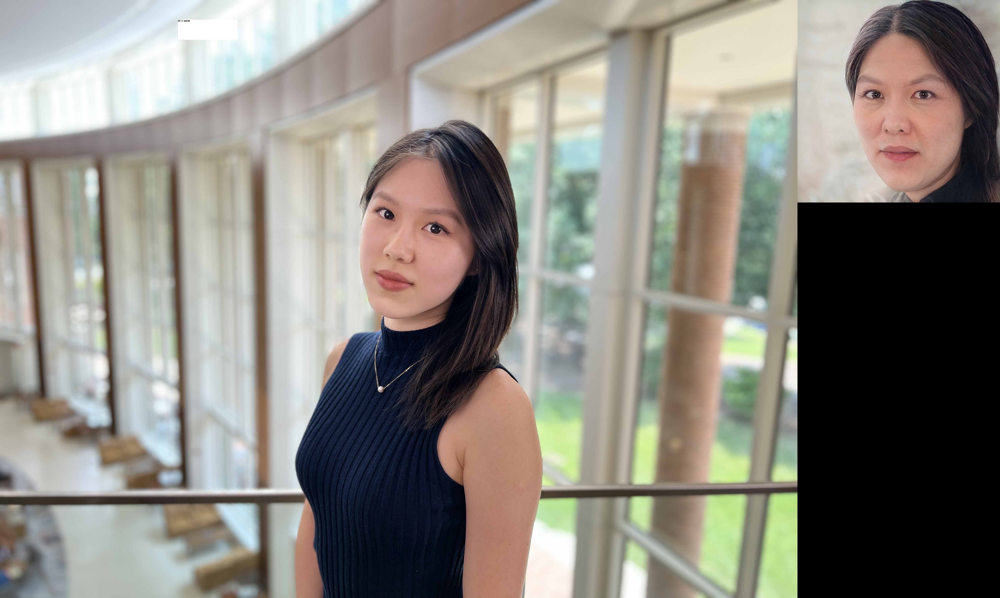

In [84]:
# Example usage
# Specify the S3 bucket name
bucket_name = 'shenh-faces-2024'

# S3 object keys (file names in the bucket)
image_key1 = 'Hewei_Shen.jpg'
image_key2 = 'Hewei_Shen_aged.jpg'
match_similarity = compare_faces(bucket_name, image_key1, image_key2)

display_images_side_by_side(bucket_name, image_key1, image_key2, match_similarity)

In [85]:
# Calculate match_similarity for all pictures in the bucket and return it to the match_file
bucket_name = 'shenh-faces-2024'
match_file['match_similarity'] = match_file.apply(lambda row: compare_faces(bucket_name, 
                                                                            row['source_image'], 
                                                                            row['target_image']), axis=1)

An error occurred: An error occurred (InvalidParameterException) when calling the CompareFaces operation: Request has invalid parameters
An error occurred: An error occurred (InvalidS3ObjectException) when calling the CompareFaces operation: Unable to get object metadata from S3. Check object key, region and/or access permissions.
An error occurred: An error occurred (InvalidS3ObjectException) when calling the CompareFaces operation: Unable to get object metadata from S3. Check object key, region and/or access permissions.


/var/folders/lx/fr986f350ps4brcwrmql5cf00000gn/T/ipykernel_64318/1894486395.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_file['match_similarity'] = match_file.apply(lambda row: compare_faces(bucket_name,


# Try 50 threshold

In [102]:
import numpy as np
match_file['predicted_match'] = np.where(match_file['match_similarity'] > 50, 'match','no match')
match_file

/var/folders/lx/fr986f350ps4brcwrmql5cf00000gn/T/ipykernel_64318/2397608272.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_file['predicted_match'] = np.where(match_file['match_similarity'] > 50, 'match','no match')


,match_id,source_image,name,target_image,expected_match,match_similarity,predicted_match
0,100,Bingyu_Li.jpg,Bingyu_Li,Bingyu_Li_aged.jpg,match,98.274345,match
1,101,Whitney_Joyce_Isbell.jpg,Whitney_Joyce_Isbell,Whitney_Joyce_Isbell_aged.jpg,match,97.822098,match
2,102,Qian_Chen.jpg,Qian_Chen,Qian_Chen_aged.jpg,match,69.764801,match
3,103,Hanshuai_Shi.jpg,Hanshuai_Shi,Hanshuai_Shi_aged.jpg,match,89.793312,match
4,104,Ruochen_Bao.jpg,Ruochen_Bao,Ruochen_Bao_aged.jpg,match,0.565411,no match
...,...,...,...,...,...,...,...
171,271,Yutong_Ouyang.jpg,NaN,Max_Koontz_aged.jpg,no match,0.330047,no match
172,272,Andrea_Chen.jpg,NaN,Joseph_Macon_Barker_aged.jpg,no match,1.274127,no match
173,273,Xiyan_Huang.jpg,NaN,Kayla_Marie_Williams_aged.jpg,no match,0.260104,no match
174,274,Angela_Waszkiewicz.jpg,NaN,Chengzhan_Shen_aged.jpg,no match,0.199939,no match


In [103]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score

# Calculate confusion matrix
matrix = confusion_matrix(match_file['expected_match'], 
                          match_file['predicted_match'], 
                          labels=["match", "no match"])

print(matrix)

[[110  15]
 [  0  50]]


In [104]:
# Calculate confusion matrix
y_true = match_file['expected_match']
y_pred = match_file['predicted_match']
labels = ["match", "no match"]
matrix = confusion_matrix(y_true, y_pred, labels=labels)

# Calculate Accuracy, Precision and Recall
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, pos_label="match")
recall = recall_score(y_true, y_pred, pos_label="match")

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)

Accuracy: 0.9142857142857143
Precision: 1.0
Recall: 0.88


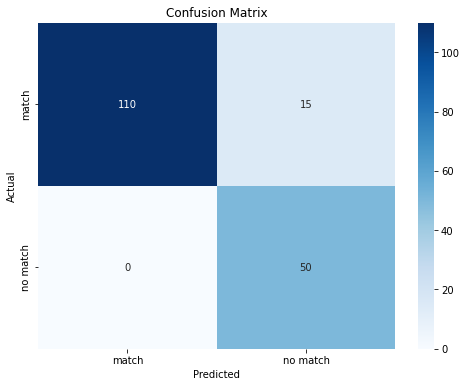

In [89]:
# Plotting using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(matrix, annot=True, fmt="d", xticklabels=labels, yticklabels=labels, cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [90]:
# match_file.to_excel('/Users/helenas/Desktop/Data Management/Project/Final Project/UseCase1AWS_match_file.xlsx')

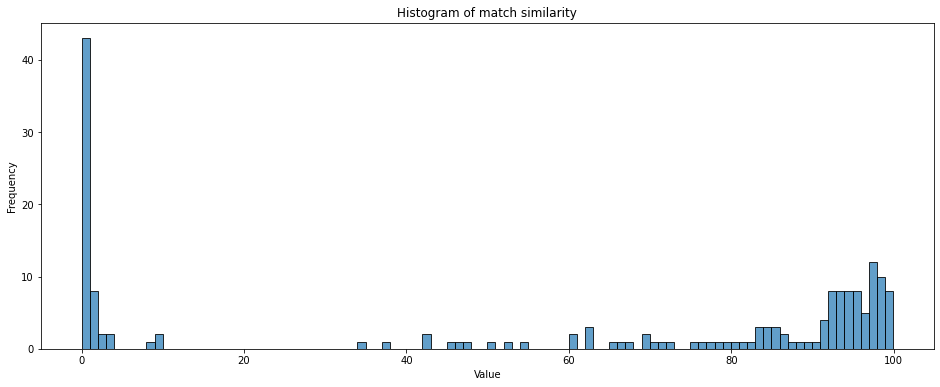

In [91]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(16, 6))
sns.histplot(match_file['match_similarity'], bins=100, kde=False, alpha=0.7)
plt.title('Histogram of match similarity')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()


In [105]:
match_file[(match_file['expected_match'] == 'match') & 
           (match_file['predicted_match'] == 'match')].sort_values(by = 'match_similarity',ascending = False)

,match_id,source_image,name,target_image,expected_match,match_similarity,predicted_match
27,127,Joseph_Macon_Barker.jpg,Joseph_Macon_Barker,Joseph_Macon_Barker_aged.jpg,match,99.918777,match
46,146,Shenger_Zhou.jpg,Shenger_Zhou,Shenger_Zhou_aged.jpg,match,99.876625,match
32,132,Nicolson_Charles_Panos.jpg,Nicolson_Charles_Panos,Nicolson_Charles_Panos_aged.jpg,match,99.538353,match
115,215,Jiahao_Ma.jpg,Jiahao_Ma,Jiahao_Ma_aged.jpg,match,99.440826,match
117,217,Alfredo_Enrique_Suarez.jpg,Alfredo_Enrique_Suarez,Alfredo_Enrique_Suarez_aged.jpg,match,99.335327,match
...,...,...,...,...,...,...,...
38,138,Yiming_Xu.jpg,Yiming_Xu,Yiming_Xu_aged.jpg,match,60.688644,match
80,180,Hangfei_Lyu.jpg,Hangfei_Lyu,Hangfei_Lyu_aged.jpg,match,60.075844,match
21,121,Hewei_Shen.jpg,Hewei_Shen,Hewei_Shen_aged.jpg,match,54.697262,match
15,115,Zihe_Liu.jpg,Zihe_Liu,Zihe_Liu_aged.jpg,match,52.800285,match


In [106]:
match_file[(match_file['expected_match'] == 'match') & 
           (match_file['predicted_match'] == 'no match')].sort_values(by = 'match_similarity',ascending = False)

,match_id,source_image,name,target_image,expected_match,match_similarity,predicted_match
78,178,Nathanael_Hunter_Kraus.jpg,Nathanael_Hunter_Kraus,Nathanael_Hunter_Kraus_aged.jpg,match,47.939983,no match
94,194,Yutong_Ouyang.jpg,Yutong_Ouyang,Yutong_Ouyang_aged.jpg,match,46.311275,no match
75,175,Yue_Zhou.jpg,Yue_Zhou,Yue_Zhou_aged.jpg,match,45.838333,no match
34,134,Amanda_Renner_Gild.jpg,Amanda_Renner_Gild,Amanda_Renner_Gild_aged.jpg,match,42.419373,no match
16,116,Shuzhe_Wang.jpg,Shuzhe_Wang,Shuzhe_Wang_aged.jpg,match,42.039116,no match
68,168,Yuchen_Qin.jpg,Yuchen_Qin,Yuchen_Qin_aged.jpg,match,37.967793,no match
121,221,Xingyu_Wan.jpg,Xingyu_Wan,Xingyu_Wan_aged.jpg,match,34.668186,no match
37,137,Haopeng_Liu.jpg,Haopeng_Liu,Haopeng_Liu_aged.jpg,match,9.191365,no match
4,104,Ruochen_Bao.jpg,Ruochen_Bao,Ruochen_Bao_aged.jpg,match,0.565411,no match
57,157,Alicia_Rand_Bodoia.jpg,Alicia_Rand_Bodoia,Alicia_Rand_Bodoia_aged.jpg,match,0.490540,no match


In [97]:
print(match_file[(match_file['match_similarity']==0)&(match_file['expected_match']=='match')].shape[0])
match_file[(match_file['match_similarity']==0)&(match_file['expected_match']=='match')]

1


,match_id,source_image,name,target_image,expected_match,match_similarity,predicted_match
76,176,Jash_Sanjaybhai_Vachhani.jpg,Jash_Sanjaybhai_Vachhani,Jash_Sanjaybhai_Vachhani_aged.jpg,match,0.0,no match


# Try 40 threshold

In [107]:
import numpy as np
match_file['predicted_match'] = np.where(match_file['match_similarity'] > 40, 'match','no match')
match_file

/var/folders/lx/fr986f350ps4brcwrmql5cf00000gn/T/ipykernel_64318/504334837.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_file['predicted_match'] = np.where(match_file['match_similarity'] > 40, 'match','no match')


,match_id,source_image,name,target_image,expected_match,match_similarity,predicted_match
0,100,Bingyu_Li.jpg,Bingyu_Li,Bingyu_Li_aged.jpg,match,98.274345,match
1,101,Whitney_Joyce_Isbell.jpg,Whitney_Joyce_Isbell,Whitney_Joyce_Isbell_aged.jpg,match,97.822098,match
2,102,Qian_Chen.jpg,Qian_Chen,Qian_Chen_aged.jpg,match,69.764801,match
3,103,Hanshuai_Shi.jpg,Hanshuai_Shi,Hanshuai_Shi_aged.jpg,match,89.793312,match
4,104,Ruochen_Bao.jpg,Ruochen_Bao,Ruochen_Bao_aged.jpg,match,0.565411,no match
...,...,...,...,...,...,...,...
171,271,Yutong_Ouyang.jpg,NaN,Max_Koontz_aged.jpg,no match,0.330047,no match
172,272,Andrea_Chen.jpg,NaN,Joseph_Macon_Barker_aged.jpg,no match,1.274127,no match
173,273,Xiyan_Huang.jpg,NaN,Kayla_Marie_Williams_aged.jpg,no match,0.260104,no match
174,274,Angela_Waszkiewicz.jpg,NaN,Chengzhan_Shen_aged.jpg,no match,0.199939,no match


In [108]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score

# Calculate confusion matrix
matrix = confusion_matrix(match_file['expected_match'], 
                          match_file['predicted_match'], 
                          labels=["match", "no match"])

print(matrix)

[[115  10]
 [  0  50]]


In [109]:
# Calculate confusion matrix
y_true = match_file['expected_match']
y_pred = match_file['predicted_match']
labels = ["match", "no match"]
matrix = confusion_matrix(y_true, y_pred, labels=labels)

# Calculate Accuracy, Precision and Recall
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, pos_label="match")
recall = recall_score(y_true, y_pred, pos_label="match")

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)

Accuracy: 0.9428571428571428
Precision: 1.0
Recall: 0.92


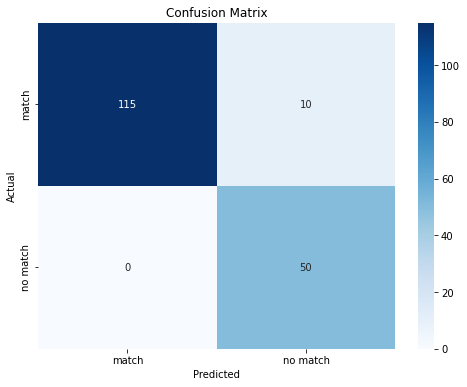

In [110]:
# Plotting using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(matrix, annot=True, fmt="d", xticklabels=labels, yticklabels=labels, cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()